In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os

import zipfile
with zipfile.ZipFile("./plates.zip", 'r') as zip_ref:
    zip_ref.extractall("./plates_data/")
# Any results you write to the current directory are saved as output.
print(os.listdir("./plates_data"))

['__MACOSX', 'plates']


In [4]:
data_root = './plates_data/plates'


In [6]:
#separate initial dataset into train and val datasets 
import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val'

class_names = ['cleaned', 'dirty']

for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        if i % 6 != 0:
            dest_dir = os.path.join(train_dir, class_name) 
        else:
            dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|█████████████████████████████████████████| 21/21 [00:00<00:00, 6382.64it/s]


(341, 256)
<PIL.Image.Image image mode=RGB size=341x256 at 0x7F233A4BA1C0>


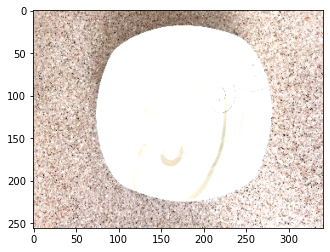

In [9]:
from PIL import Image
import numpy as np
from torchvision import transforms
from torchvision.transforms import ToTensor,ToPILImage
from matplotlib.pyplot import imshow

img_path="./val/dirty/0005.jpg"
image = Image.open(img_path, 'r')
imshow(np.asarray(image))
print(image.size)
# image = ToTensor()(image).unsqueeze(0) # unsqueeze to add artificial first dimension
# image = ToTensor()(image)
# print(image.size())
trans=transforms.Compose([
    transforms.ColorJitter(brightness=[1.0,2.0])])
image=trans(image)
# image=ToPILImage()(image)
print(image)
imshow(np.asarray(image)) 

In [10]:
import torch
import PIL
import matplotlib.pyplot as plt
import torchvision
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['image.interpolation'] = 'nearest'
mpl.rcParams['figure.figsize'] = 15, 25

def show_dataset(dataset, n=6):
    img = np.vstack((np.hstack((np.asarray(dataset[i][0]) for _ in range(n)))
                   for i in range(len(dataset))))
    plt.imshow(img)
    plt.axis('off')

transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224,224)),
    torchvision.transforms.ColorJitter(hue=.05, saturation=.05),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(20, resample=PIL.Image.BILINEAR)
])

/home/becks_ddf/anaconda3/envs/dishes/lib/python3.9/site-packages/torchvision/transforms/transforms.py:1248: UserWarning: Argument resample is deprecated and will be removed since v0.10.0. Please, use interpolation instead
  warnings.warn(


/tmp/ipykernel_564559/2050856378.py:13: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  img = np.vstack((np.hstack((np.asarray(dataset[i][0]) for _ in range(n)))


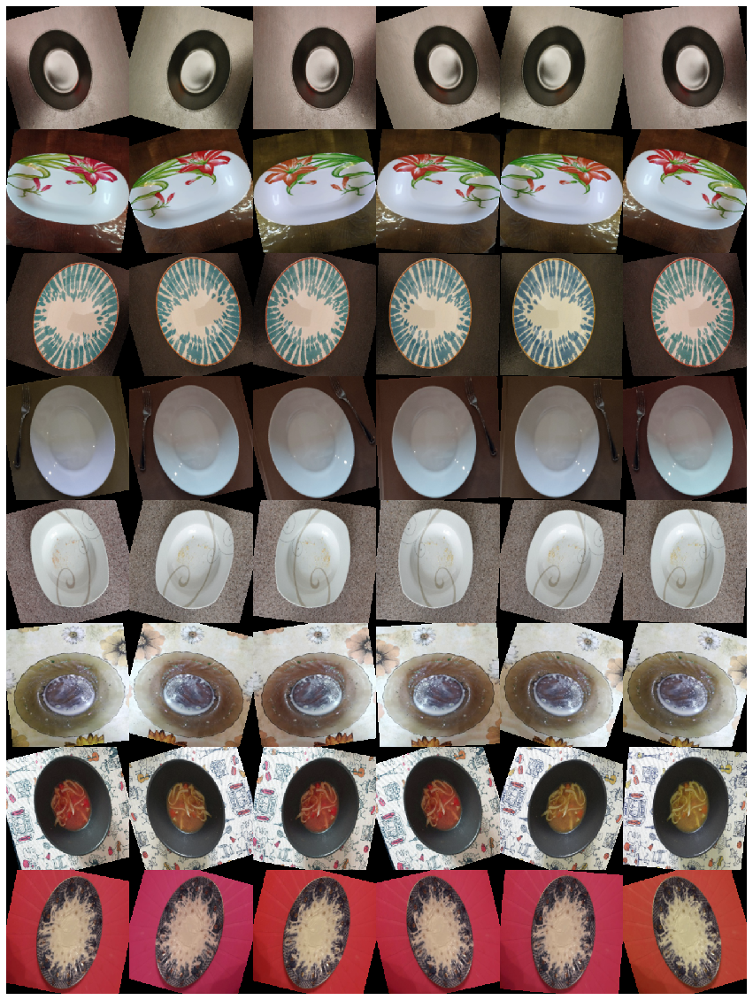

In [11]:
dataset1 = torchvision.datasets.ImageFolder('val',transform=transforms)
show_dataset(dataset1)

In [14]:
from imgaug import augmenters as iaa
import imgaug as ia

class ImgAugTransform:
    def __init__(self):
        self.aug = iaa.Sequential([
            iaa.Scale((224, 224)),
            iaa.Sometimes(0.25, iaa.GaussianBlur(sigma=(0, 3.0))),
            iaa.Fliplr(0.5),
            iaa.Affine(rotate=(-20, 20), mode='symmetric'),
            iaa.Sometimes(0.25,
                          iaa.OneOf([iaa.Dropout(p=(0, 0.1)),
                                     iaa.CoarseDropout(0.1, size_percent=0.5)])),
            iaa.AddToHueAndSaturation(value=(-10, 10), per_channel=True)
        ])

    def __call__(self, img):
        img = np.array(img)
        return self.aug.augment_image(img)

transforms = ImgAugTransform()

dataset = torchvision.datasets.ImageFolder('val', transform=transforms)


/home/becks_ddf/anaconda3/envs/dishes/lib/python3.9/site-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `Scale()` is deprecated. Use `Resize` instead. Resize has the exactly same interface as Scale.
  warn_deprecated(msg, stacklevel=3)


/tmp/ipykernel_564559/2050856378.py:13: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  img = np.vstack((np.hstack((np.asarray(dataset[i][0]) for _ in range(n)))


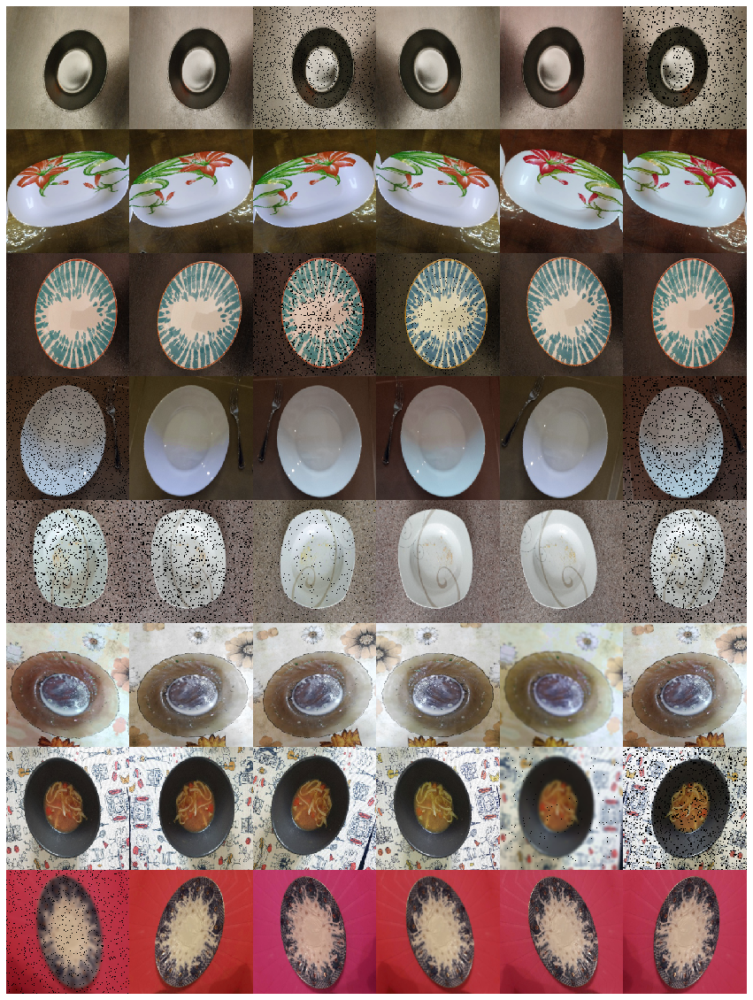

In [15]:
show_dataset(dataset)

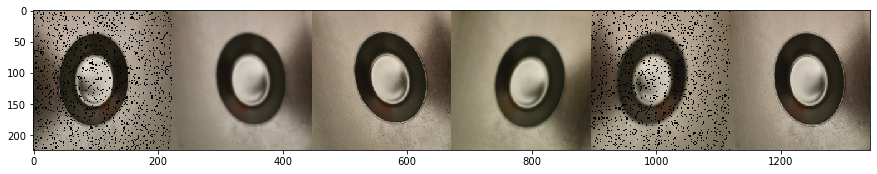

In [16]:
aug = iaa.Affine(rotate=(-40, 40), mode='symmetric')
imgs = [np.asarray(dataset[0][0]) for _ in range(6)]
aug.augment_images(imgs)
plt.imshow(np.hstack(imgs))

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Function `Scale()` is deprecated. Use `Resize` instead. Resize has the exactly same interface as Scale.
  import sys
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  del sys.path[0]


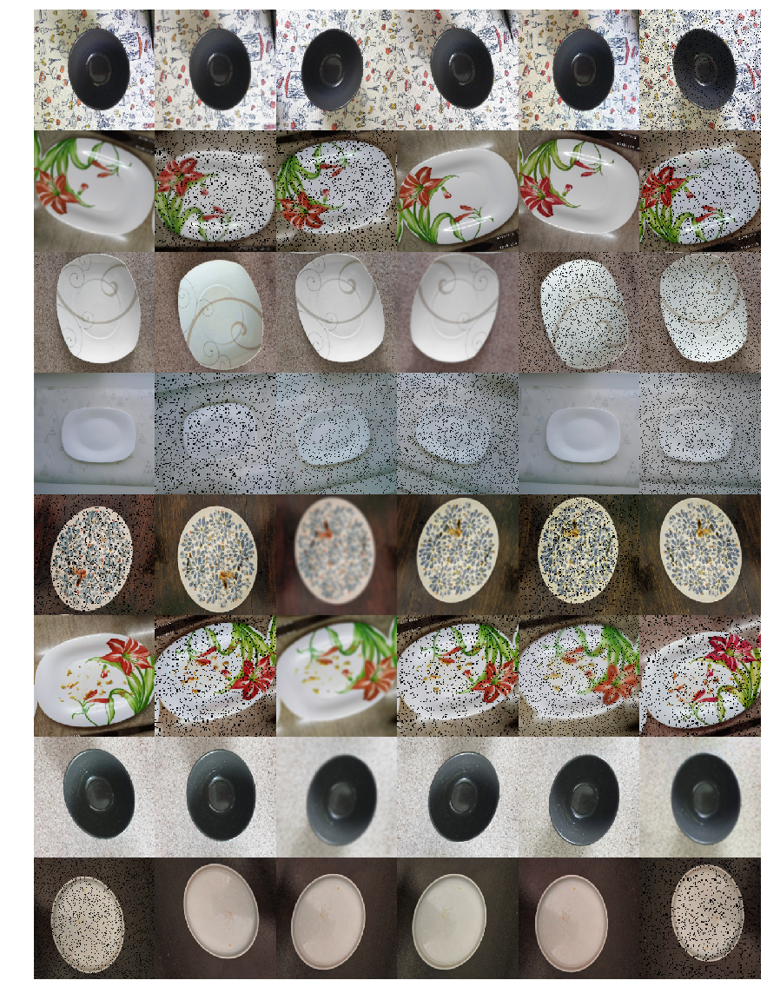

In [16]:
transforms = torchvision.transforms.Compose([
    ImgAugTransform(),lambda x: PIL.Image.fromarray(x),
    torchvision.transforms.RandomVerticalFlip()
])

dataset = torchvision.datasets.ImageFolder('val', transform=transforms)

show_dataset(dataset)

In [17]:
import torch
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import time
import copy

from torchvision import transforms, models
train_transforms = transforms.Compose([ImgAugTransform(),lambda x: PIL.Image.fromarray(x),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)

batch_size = 8
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [13]:
len(train_dataloader), len(train_dataset)

(4, 32)

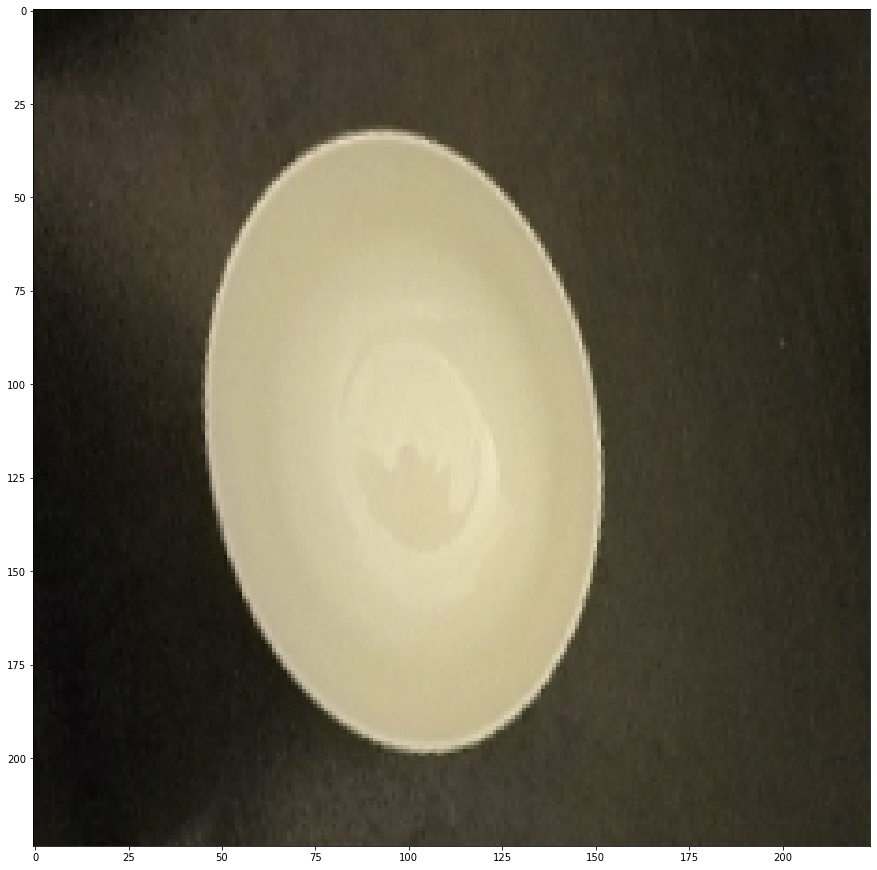

In [18]:
X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

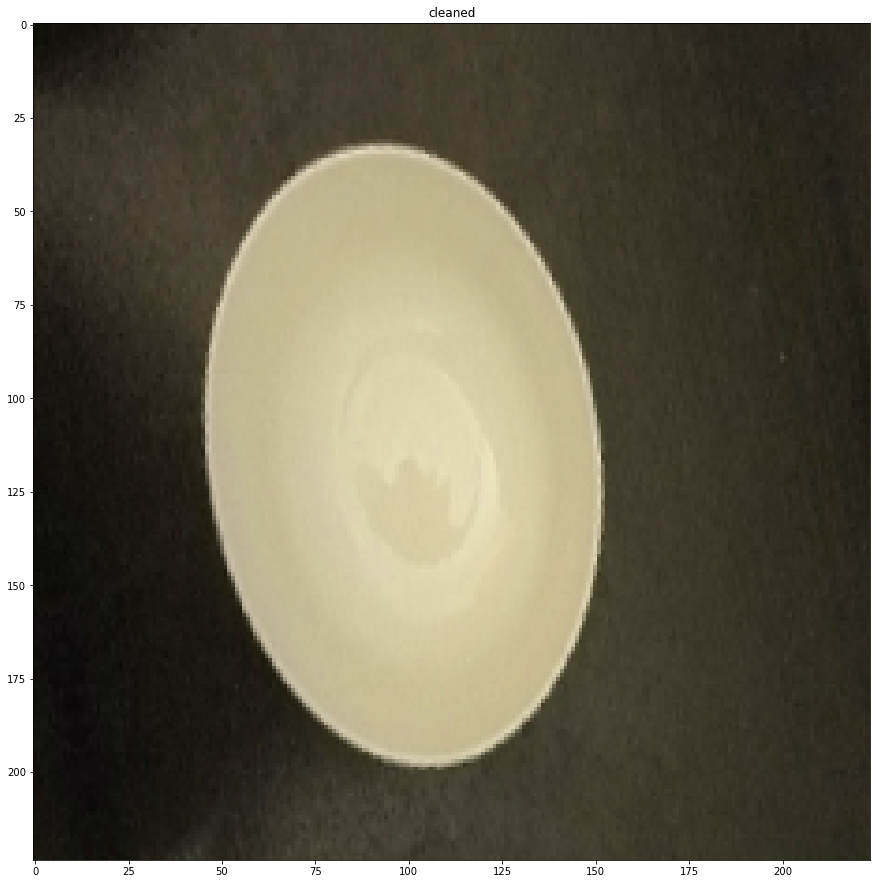

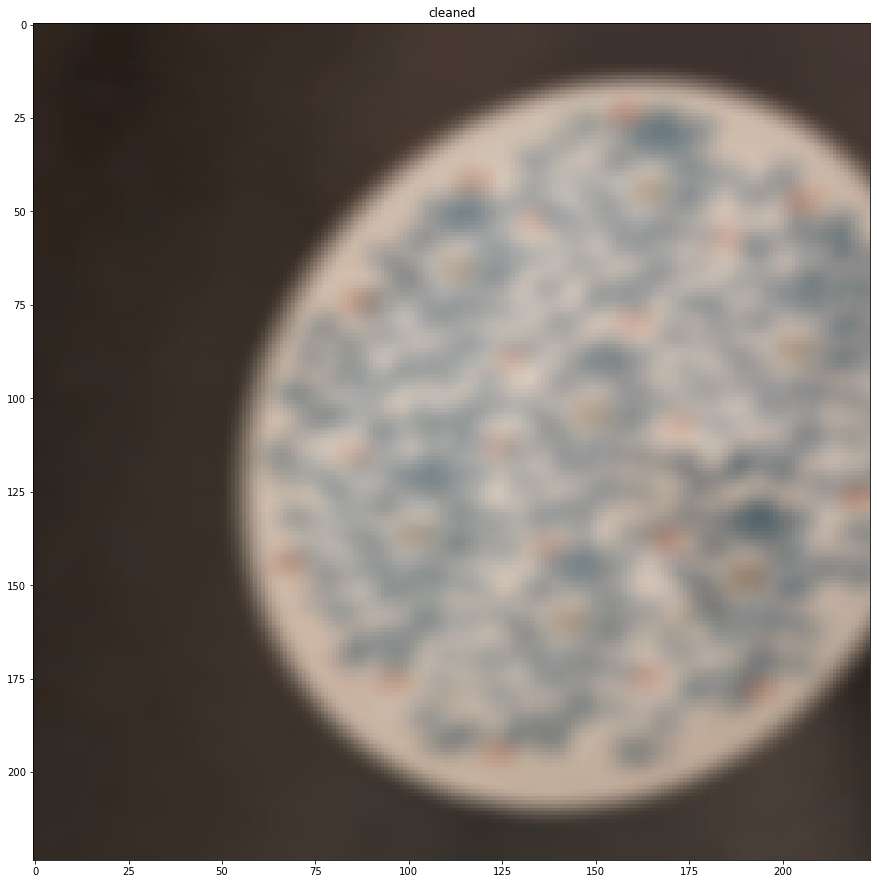

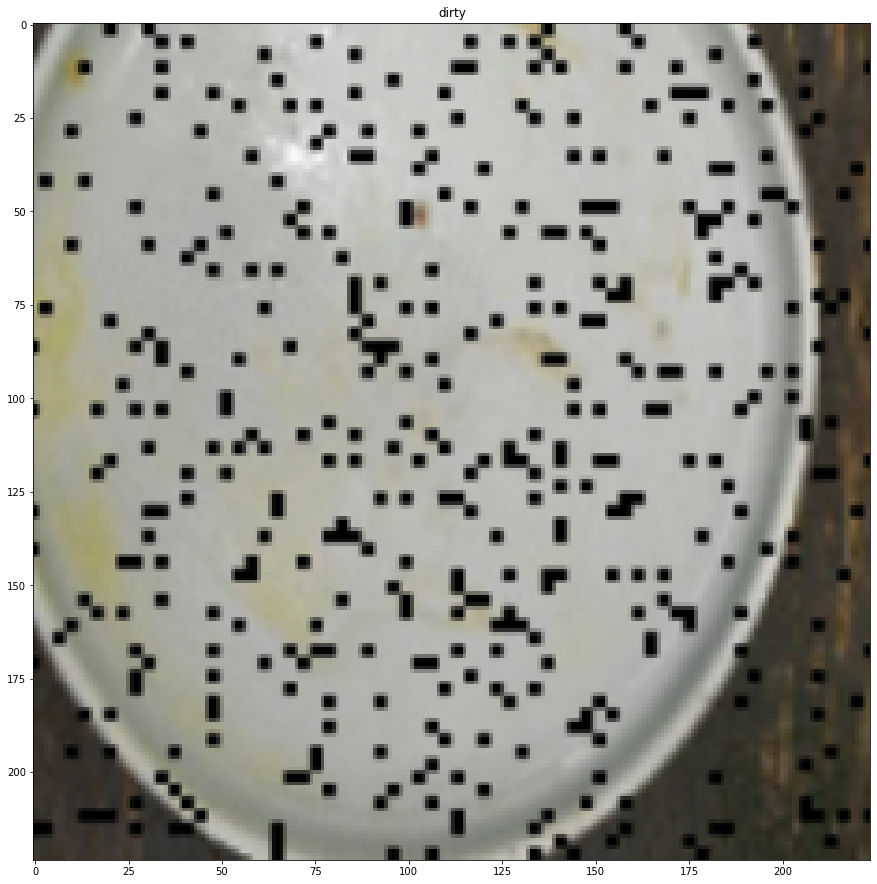

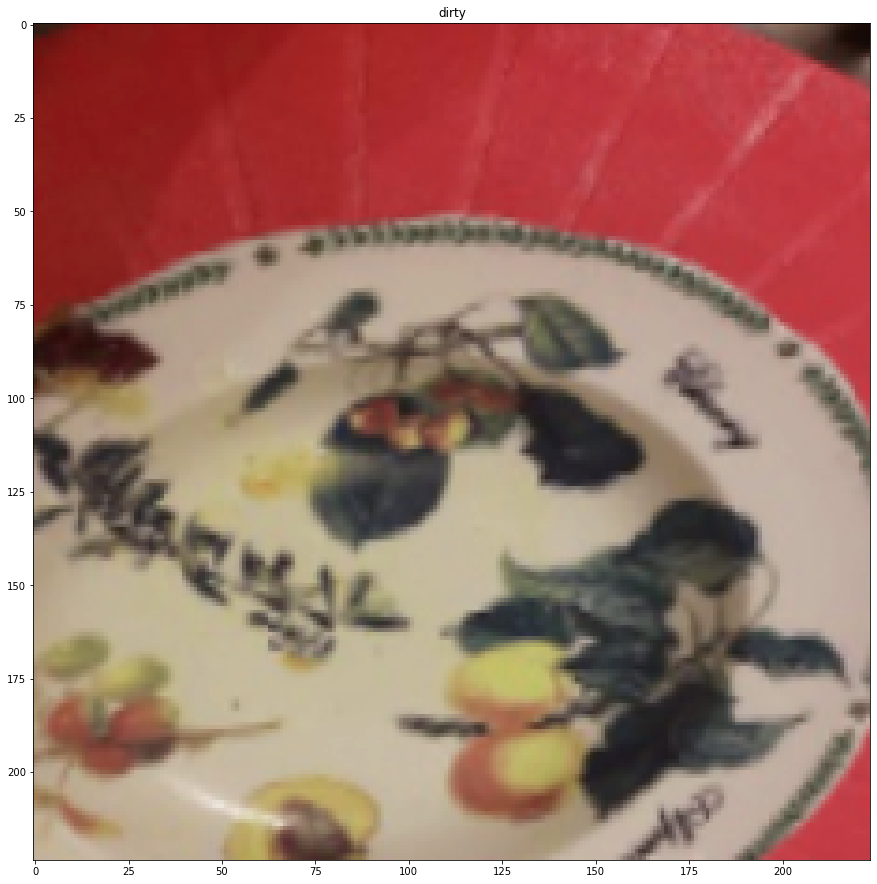

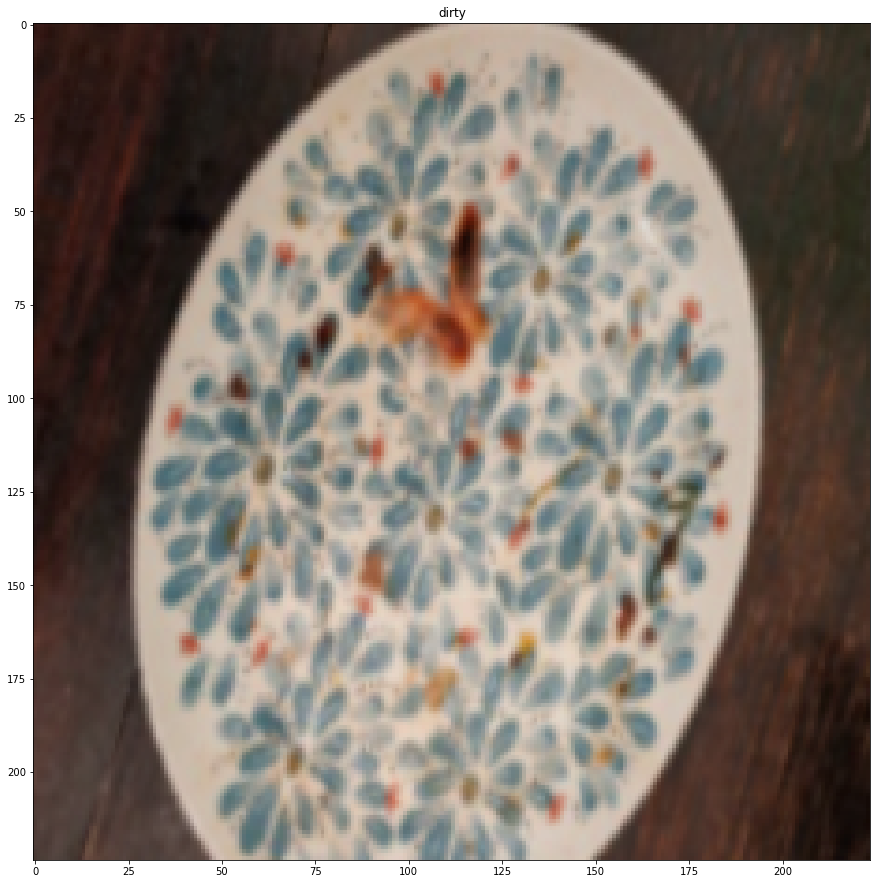

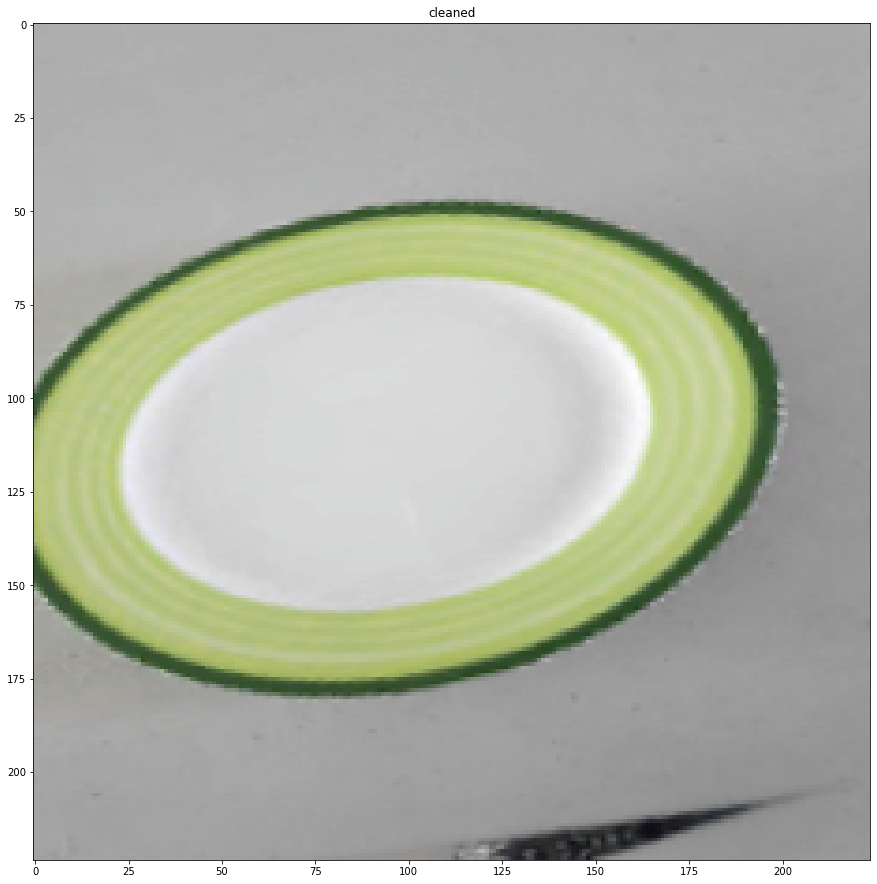

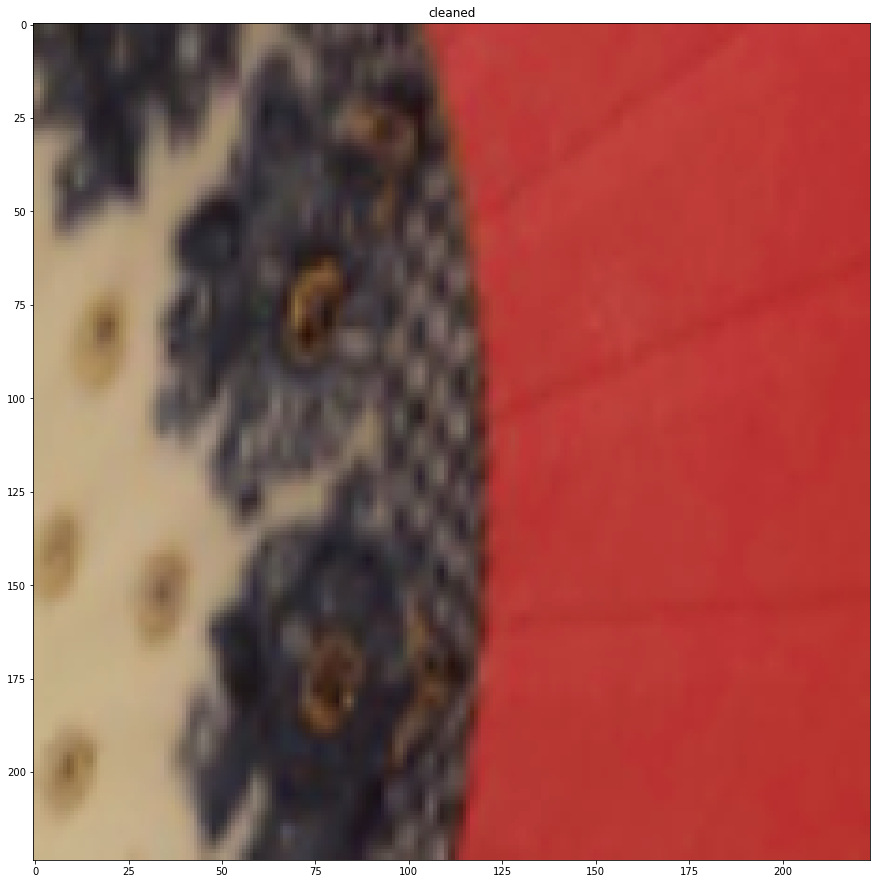

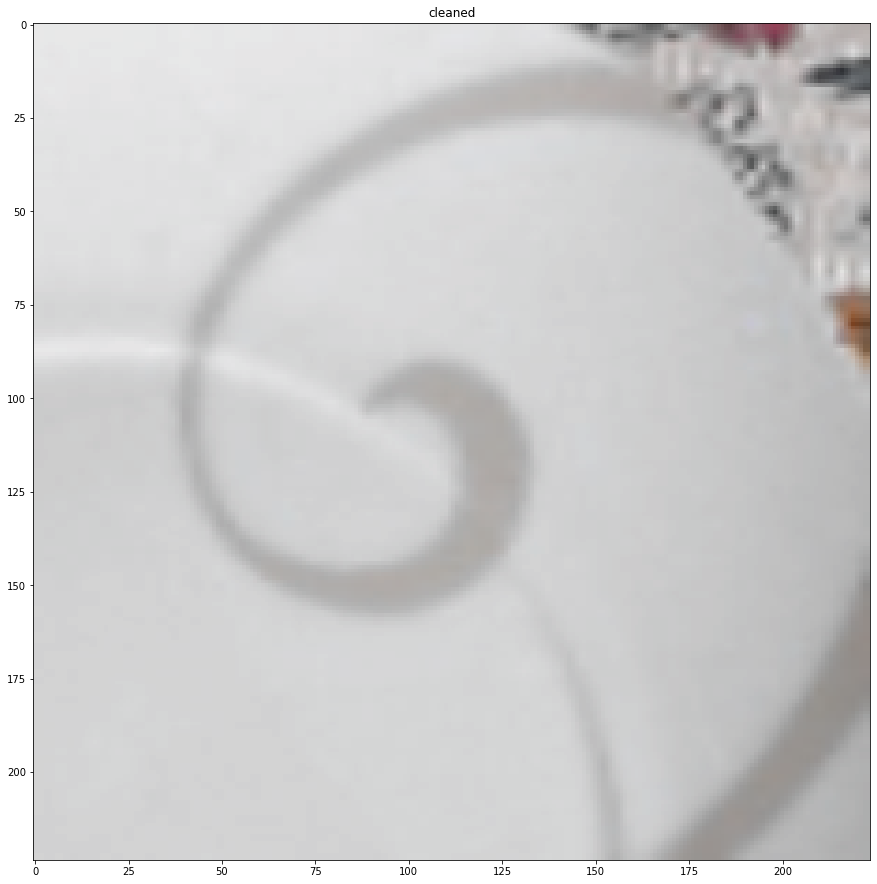

In [19]:
def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)
    
    X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [31]:
train_acc = []
train_loss = []
val_acc = []
val_loss = []
def train_model(model, loss, optimizer, scheduler, num_epochs):
    for epoch in range(num_epochs):
        print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader
#                 scheduler.step()
                model.train()  # Set model to training mode
                acc_history=train_acc
                loss_history=train_loss
            else:
                dataloader = val_dataloader
                model.eval()   # Set model to evaluate mode
                acc_history=val_acc
                loss_history=val_loss

            running_loss = 0.
            running_acc = 0.

            # Iterate over data.
            for inputs, labels in tqdm(dataloader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                # forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs)
                    loss_value = loss(preds, labels)
                    preds_class = preds.argmax(dim=1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()

                # statistics
                running_loss += loss_value.item()
                running_acc += (preds_class == labels.data).float().mean()

            epoch_loss = running_loss / len(dataloader)
            epoch_acc = running_acc / len(dataloader)
            loss_history.append(epoch_loss) 
            acc_history.append(epoch_acc)
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)
            if phase == 'val': scheduler.step(epoch_loss)
    return model

In [32]:
model = models.resnet18(pretrained=True)

# Disable grad for all conv layers
for param in model.parameters():
    param.requires_grad = False

model.fc = torch.nn.Linear(model.fc.in_features, 2)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-3)

# Decay LR by a factor of 0.1 every 7 epochs
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [22]:
torch.backends.cudnn.enabled

True

In [23]:
xxx = torch.rand(13, 13).cuda()
yyy = torch.rand(13,13).cuda()
print(xxx+yyy)

tensor([[1.2906, 1.0542, 0.5666, 1.8024, 0.8444, 0.4215, 1.2426, 1.5785, 0.1996,
         0.5842, 0.3839, 0.8390, 1.4243],
        [1.2832, 0.9383, 0.8368, 1.6842, 1.6834, 1.2326, 1.2824, 0.8897, 1.2791,
         0.8534, 0.5993, 1.5343, 0.6399],
        [0.4316, 0.4735, 0.2557, 1.1645, 1.4037, 1.1138, 1.5471, 0.8728, 1.1889,
         0.6507, 0.8016, 0.4826, 0.1426],
        [0.5479, 1.0429, 0.9999, 1.2502, 0.8108, 1.7566, 0.7441, 1.7723, 0.7965,
         0.6179, 1.0392, 1.2297, 1.1679],
        [1.5028, 1.3984, 1.2655, 0.9540, 1.3294, 0.9471, 0.6478, 0.3156, 0.8771,
         0.9582, 1.3781, 0.5236, 0.1402],
        [1.8374, 0.6573, 0.7530, 0.8540, 1.2482, 0.5201, 0.6250, 1.4194, 1.1398,
         1.1217, 0.3122, 1.1118, 0.1502],
        [1.0437, 1.2150, 1.6929, 1.3086, 0.7443, 0.9190, 0.9865, 1.3532, 0.7878,
         1.0870, 1.3420, 1.3135, 0.4118],
        [0.5596, 0.8144, 0.7061, 0.7094, 1.1591, 0.7404, 1.5370, 1.1985, 1.0093,
         1.3472, 1.8199, 1.3739, 1.3748],
        [0.3893,

In [25]:
torch.__version__

'1.10.0'

In [24]:
torch.backends.cudnn.version()

7605

In [26]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
cuda0 = torch.device('cuda:0')
abc=torch.tensor([0.9200,0.08,1.0, 0.01])
x=torch.tensor(abc).to(cuda0)
# print(x)
print(x.device)
x=x.to('cpu')
print(x)
print(x.device)

cuda:0
tensor([0.9200, 0.0800, 1.0000, 0.0100])
cpu


/tmp/ipykernel_564559/3300581049.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x=torch.tensor(abc).to(cuda0)


In [33]:
train_model(model, loss, optimizer, scheduler, num_epochs=100);

Epoch 0/99:


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 11.72it/s]

train Loss: 0.8365 Acc: 0.4062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.10it/s]

val Loss: 0.6731 Acc: 0.5000
Epoch 1/99:



/home/becks_ddf/anaconda3/envs/dishes/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:154: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.54it/s]

train Loss: 0.7224 Acc: 0.5625



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.76it/s]

val Loss: 0.7148 Acc: 0.5000
Epoch 2/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.83it/s]

train Loss: 0.6446 Acc: 0.6562



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.11it/s]

val Loss: 0.6231 Acc: 0.6250
Epoch 3/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.09it/s]

train Loss: 0.6875 Acc: 0.4688



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.28it/s]

val Loss: 0.6228 Acc: 0.6250
Epoch 4/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.78it/s]

train Loss: 0.6516 Acc: 0.6250



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.14it/s]

val Loss: 0.6467 Acc: 0.6250
Epoch 5/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.17it/s]

train Loss: 0.6885 Acc: 0.5625



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.24it/s]

val Loss: 0.6737 Acc: 0.5000
Epoch 6/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 12.89it/s]

train Loss: 0.5683 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.58it/s]

val Loss: 0.6395 Acc: 0.7500


Epoch 7/99:


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.66it/s]

train Loss: 0.7433 Acc: 0.5625



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.14it/s]

val Loss: 0.6138 Acc: 0.6250
Epoch 8/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.34it/s]

train Loss: 0.6195 Acc: 0.6875



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.92it/s]

val Loss: 0.6375 Acc: 0.5000
Epoch 9/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.54it/s]

train Loss: 0.5636 Acc: 0.6562



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.39it/s]

val Loss: 0.6238 Acc: 0.5000
Epoch 10/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.84it/s]

train Loss: 0.5797 Acc: 0.6562



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.43it/s]

val Loss: 0.5983 Acc: 0.6250
Epoch 11/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.68it/s]

train Loss: 0.4671 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.42it/s]

val Loss: 0.5762 Acc: 0.6250
Epoch 12/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.41it/s]

train Loss: 0.5494 Acc: 0.6875



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.43it/s]

val Loss: 0.5870 Acc: 0.6250
Epoch 13/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.21it/s]

train Loss: 0.5010 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.89it/s]

val Loss: 0.5819 Acc: 0.6250
Epoch 14/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.72it/s]

train Loss: 0.5326 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.24it/s]

val Loss: 0.5791 Acc: 0.6250
Epoch 15/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 16.06it/s]

train Loss: 0.5248 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.01it/s]

val Loss: 0.5791 Acc: 0.6250
Epoch 16/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.78it/s]

train Loss: 0.4729 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 13.76it/s]

val Loss: 0.5718 Acc: 0.6250


Epoch 17/99:


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.31it/s]

train Loss: 0.5176 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.43it/s]

val Loss: 0.5830 Acc: 0.5000
Epoch 18/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.29it/s]

train Loss: 0.6185 Acc: 0.6250



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.77it/s]

val Loss: 0.5994 Acc: 0.5000
Epoch 19/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.16it/s]

train Loss: 0.6221 Acc: 0.6562



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.19it/s]

val Loss: 0.5577 Acc: 0.6250
Epoch 20/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.15it/s]

train Loss: 0.5135 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.15it/s]

val Loss: 0.5747 Acc: 0.5000
Epoch 21/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.64it/s]

train Loss: 0.3808 Acc: 0.9375



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.57it/s]

val Loss: 0.5626 Acc: 0.6250
Epoch 22/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.23it/s]

train Loss: 0.4455 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 24.36it/s]

val Loss: 0.5348 Acc: 0.6250
Epoch 23/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.03it/s]

train Loss: 0.4610 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.87it/s]

val Loss: 0.5463 Acc: 0.6250
Epoch 24/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.33it/s]

train Loss: 0.4893 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.59it/s]

val Loss: 0.5609 Acc: 0.6250
Epoch 25/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.23it/s]

train Loss: 0.5078 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.95it/s]

val Loss: 0.5732 Acc: 0.6250
Epoch 26/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.08it/s]

train Loss: 0.5410 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.48it/s]

val Loss: 0.5585 Acc: 0.6250
Epoch 27/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 11.72it/s]

train Loss: 0.5196 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.72it/s]

val Loss: 0.5432 Acc: 0.6250
Epoch 28/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.47it/s]

train Loss: 0.5191 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.14it/s]

val Loss: 0.5415 Acc: 0.6250
Epoch 29/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.20it/s]

train Loss: 0.4231 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.52it/s]

val Loss: 0.5610 Acc: 0.6250
Epoch 30/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.44it/s]

train Loss: 0.4472 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.49it/s]

val Loss: 0.5632 Acc: 0.6250
Epoch 31/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.96it/s]

train Loss: 0.3573 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.31it/s]

val Loss: 0.5757 Acc: 0.6250
Epoch 32/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.35it/s]

train Loss: 0.4508 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.10it/s]

val Loss: 0.5891 Acc: 0.6250
Epoch 33/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.22it/s]

train Loss: 0.3922 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.18it/s]

val Loss: 0.5546 Acc: 0.6250
Epoch 34/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.49it/s]

train Loss: 0.3901 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.98it/s]

val Loss: 0.5735 Acc: 0.6250
Epoch 35/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.23it/s]

train Loss: 0.3937 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.77it/s]

val Loss: 0.5816 Acc: 0.6250
Epoch 36/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.41it/s]

train Loss: 0.3869 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.35it/s]

val Loss: 0.5763 Acc: 0.6250
Epoch 37/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.77it/s]

train Loss: 0.4496 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.84it/s]

val Loss: 0.6163 Acc: 0.5000
Epoch 38/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.33it/s]

train Loss: 0.3984 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.20it/s]

val Loss: 0.6112 Acc: 0.5000
Epoch 39/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.52it/s]

train Loss: 0.4157 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.03it/s]

val Loss: 0.6077 Acc: 0.5000
Epoch 40/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.63it/s]

train Loss: 0.4381 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.28it/s]

val Loss: 0.6775 Acc: 0.6250
Epoch 41/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.70it/s]

train Loss: 0.4153 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.51it/s]

val Loss: 0.6421 Acc: 0.5000
Epoch 42/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.66it/s]

train Loss: 0.4947 Acc: 0.6875



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.00it/s]

val Loss: 0.6196 Acc: 0.5000
Epoch 43/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.65it/s]

train Loss: 0.4660 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.22it/s]

val Loss: 0.5870 Acc: 0.5000
Epoch 44/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.90it/s]

train Loss: 0.4658 Acc: 0.6875



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.50it/s]

val Loss: 0.7106 Acc: 0.6250
Epoch 45/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.17it/s]

train Loss: 0.4437 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.94it/s]

val Loss: 0.6787 Acc: 0.6250
Epoch 46/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.12it/s]

train Loss: 0.3999 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.41it/s]

val Loss: 0.6243 Acc: 0.5000
Epoch 47/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 15.09it/s]

train Loss: 0.3308 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.86it/s]

val Loss: 0.6318 Acc: 0.5000
Epoch 48/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.95it/s]

train Loss: 0.4136 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.01it/s]

val Loss: 0.6222 Acc: 0.5000
Epoch 49/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.33it/s]

train Loss: 0.4678 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.07it/s]

val Loss: 0.6374 Acc: 0.6250
Epoch 50/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.46it/s]

train Loss: 0.4164 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.07it/s]

val Loss: 0.7200 Acc: 0.6250
Epoch 51/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.98it/s]

train Loss: 0.4554 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.84it/s]

val Loss: 0.6674 Acc: 0.6250
Epoch 52/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.88it/s]

train Loss: 0.5441 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.85it/s]

val Loss: 0.6116 Acc: 0.7500
Epoch 53/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.29it/s]

train Loss: 0.6260 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.31it/s]

val Loss: 0.6240 Acc: 0.6250
Epoch 54/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.33it/s]

train Loss: 0.5313 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.39it/s]

val Loss: 0.6010 Acc: 0.7500
Epoch 55/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.70it/s]

train Loss: 0.3782 Acc: 0.9062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.92it/s]

val Loss: 0.6534 Acc: 0.6250
Epoch 56/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.00it/s]

train Loss: 0.4129 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.42it/s]

val Loss: 0.7031 Acc: 0.6250
Epoch 57/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 12.62it/s]

train Loss: 0.4441 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.47it/s]

val Loss: 0.5892 Acc: 0.8750
Epoch 58/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.44it/s]

train Loss: 0.3449 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.46it/s]

val Loss: 0.5475 Acc: 0.7500
Epoch 59/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.50it/s]

train Loss: 0.4712 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.66it/s]

val Loss: 0.5520 Acc: 0.7500
Epoch 60/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.09it/s]

train Loss: 0.4326 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.56it/s]

val Loss: 0.5916 Acc: 0.8750
Epoch 61/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.09it/s]

train Loss: 0.3855 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.47it/s]

val Loss: 0.6529 Acc: 0.6250
Epoch 62/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.40it/s]

train Loss: 0.5374 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.52it/s]

val Loss: 0.7372 Acc: 0.6250
Epoch 63/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.21it/s]

train Loss: 0.4698 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 18.98it/s]

val Loss: 0.6892 Acc: 0.6250
Epoch 64/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.42it/s]

train Loss: 0.3733 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.87it/s]

val Loss: 0.6535 Acc: 0.5000
Epoch 65/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.22it/s]

train Loss: 0.3942 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.37it/s]

val Loss: 0.6458 Acc: 0.5000
Epoch 66/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.50it/s]

train Loss: 0.3264 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.43it/s]

val Loss: 0.6283 Acc: 0.7500
Epoch 67/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.57it/s]

train Loss: 0.3658 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.83it/s]

val Loss: 0.6989 Acc: 0.6250
Epoch 68/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.15it/s]

train Loss: 0.3019 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.20it/s]

val Loss: 0.7113 Acc: 0.6250
Epoch 69/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.89it/s]

train Loss: 0.3186 Acc: 0.9062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.57it/s]

val Loss: 0.6715 Acc: 0.5000
Epoch 70/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.99it/s]

train Loss: 0.3424 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.85it/s]

val Loss: 0.6967 Acc: 0.6250
Epoch 71/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.73it/s]

train Loss: 0.4929 Acc: 0.7188



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.37it/s]

val Loss: 0.7520 Acc: 0.6250
Epoch 72/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.22it/s]

train Loss: 0.3667 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.49it/s]

val Loss: 0.7291 Acc: 0.6250
Epoch 73/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.32it/s]

train Loss: 0.3582 Acc: 0.8125



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.77it/s]

val Loss: 0.7220 Acc: 0.6250
Epoch 74/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.85it/s]

train Loss: 0.3608 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.55it/s]

val Loss: 0.7575 Acc: 0.6250
Epoch 75/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.24it/s]

train Loss: 0.4060 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.43it/s]

val Loss: 0.7404 Acc: 0.6250
Epoch 76/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.75it/s]

train Loss: 0.3887 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.12it/s]

val Loss: 0.6881 Acc: 0.5000
Epoch 77/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.95it/s]

train Loss: 0.3243 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.72it/s]

val Loss: 0.6734 Acc: 0.6250
Epoch 78/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.35it/s]

train Loss: 0.3675 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.10it/s]

val Loss: 0.6879 Acc: 0.6250
Epoch 79/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.17it/s]

train Loss: 0.3896 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.24it/s]

val Loss: 0.6903 Acc: 0.5000
Epoch 80/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.61it/s]

train Loss: 0.2770 Acc: 0.9062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.35it/s]

val Loss: 0.7091 Acc: 0.5000
Epoch 81/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.89it/s]

train Loss: 0.2850 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.04it/s]

val Loss: 0.7563 Acc: 0.6250
Epoch 82/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.58it/s]

train Loss: 0.3838 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.72it/s]

val Loss: 0.7519 Acc: 0.6250
Epoch 83/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.96it/s]

train Loss: 0.3585 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.64it/s]

val Loss: 0.6852 Acc: 0.6250
Epoch 84/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.14it/s]

train Loss: 0.3304 Acc: 0.9375



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.70it/s]

val Loss: 0.6579 Acc: 0.7500
Epoch 85/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.48it/s]

train Loss: 0.3901 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.76it/s]

val Loss: 0.6869 Acc: 0.6250
Epoch 86/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.46it/s]

train Loss: 0.5239 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.92it/s]

val Loss: 0.8161 Acc: 0.6250
Epoch 87/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.49it/s]

train Loss: 0.2893 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.17it/s]

val Loss: 0.6904 Acc: 0.6250
Epoch 88/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 12.72it/s]

train Loss: 0.3470 Acc: 0.9062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 19.25it/s]

val Loss: 0.6902 Acc: 0.6250
Epoch 89/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.27it/s]

train Loss: 0.4873 Acc: 0.7812



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.53it/s]

val Loss: 0.7386 Acc: 0.6250
Epoch 90/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.22it/s]

train Loss: 0.3024 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.33it/s]

val Loss: 0.7295 Acc: 0.6250
Epoch 91/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.34it/s]

train Loss: 0.3379 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 17.92it/s]

val Loss: 0.6963 Acc: 0.7500
Epoch 92/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.56it/s]

train Loss: 0.2671 Acc: 0.9375



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.55it/s]

val Loss: 0.6795 Acc: 0.7500
Epoch 93/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.40it/s]

train Loss: 0.2397 Acc: 0.9062



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 23.01it/s]

val Loss: 0.7287 Acc: 0.6250
Epoch 94/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.51it/s]

train Loss: 0.3681 Acc: 0.8750



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 22.40it/s]

val Loss: 0.6694 Acc: 0.7500
Epoch 95/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.52it/s]

train Loss: 0.4455 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.02it/s]

val Loss: 0.6821 Acc: 0.8750
Epoch 96/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.15it/s]

train Loss: 0.4147 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.24it/s]

val Loss: 0.6874 Acc: 0.8750
Epoch 97/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 14.34it/s]

train Loss: 0.2313 Acc: 0.9375



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.10it/s]

val Loss: 0.7931 Acc: 0.6250
Epoch 98/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.99it/s]

train Loss: 0.4089 Acc: 0.7500



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 21.12it/s]

val Loss: 0.7967 Acc: 0.6250
Epoch 99/99:



100%|█████████████████████████████████████████████| 4/4 [00:00<00:00, 13.83it/s]

train Loss: 0.3987 Acc: 0.8438



100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 20.60it/s]

val Loss: 0.7069 Acc: 0.7500


Text(0.5, 0.98, 'Adam')

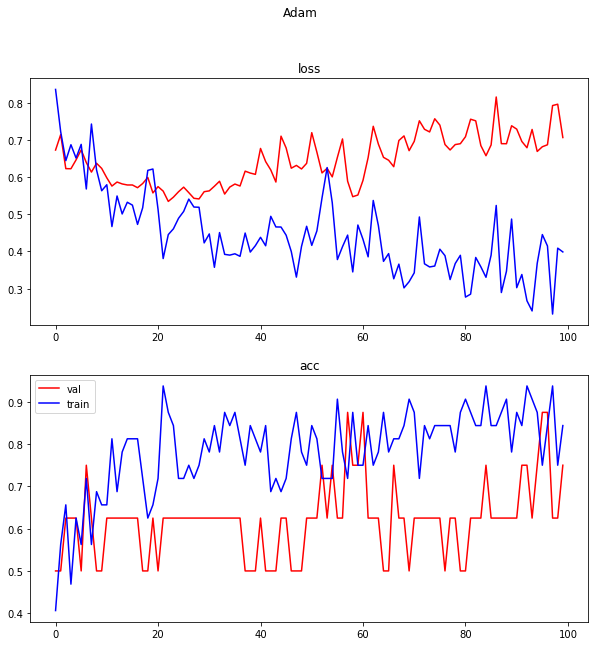

In [34]:
plt.figure(figsize=(10,10))
plt.title('dsadasdas')
plt.subplot(211)
plt.plot(val_loss,'-r',train_loss, 'b')
plt.title('loss')

plt.subplot(212)
plt.plot(val_acc,'-r',label='val')
plt.plot(train_acc, 'b',label='train')
plt.title('acc')
plt.legend()

plt.suptitle('Adam')

100%|███████████████████████████████████████████| 93/93 [00:02<00:00, 37.83it/s]


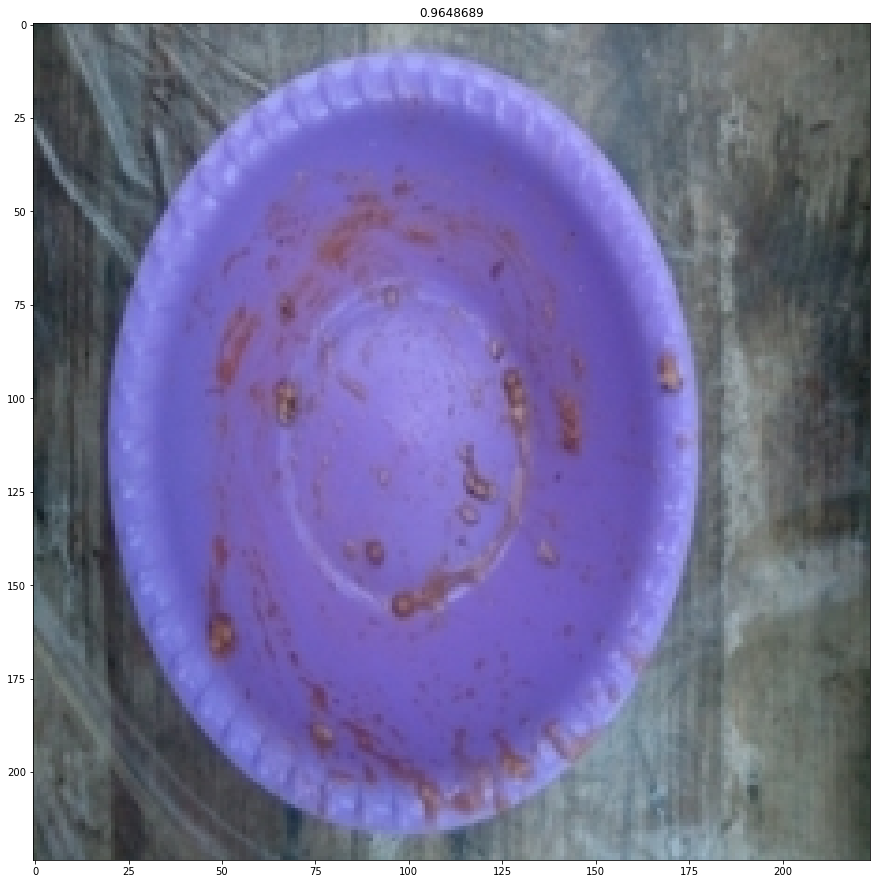

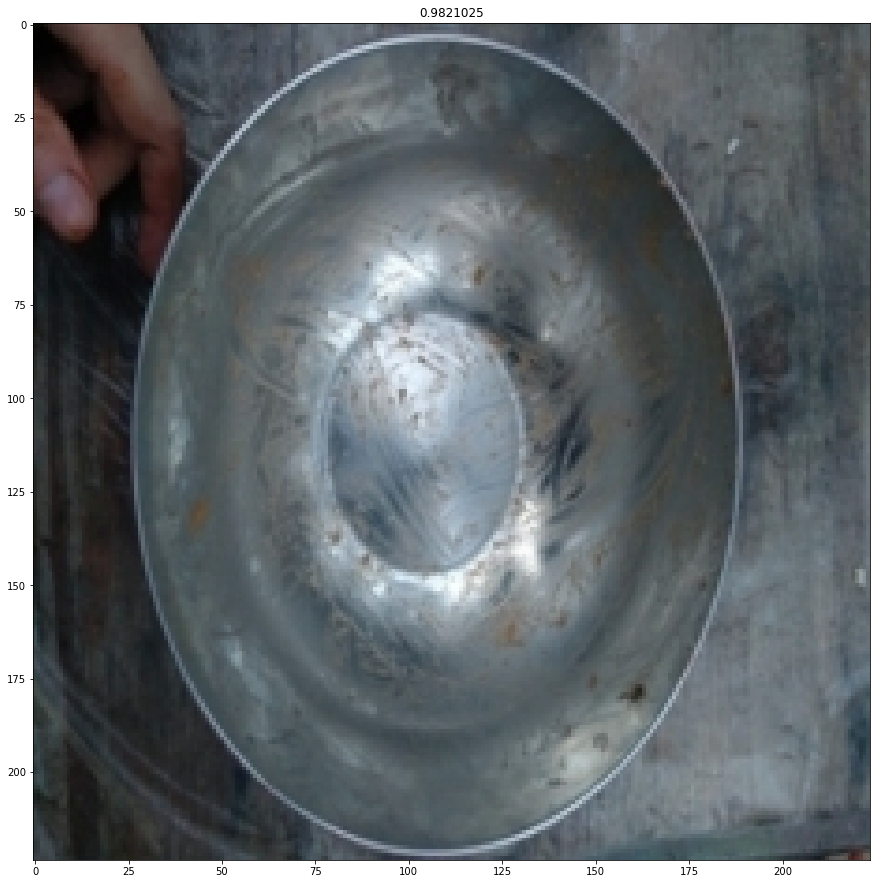

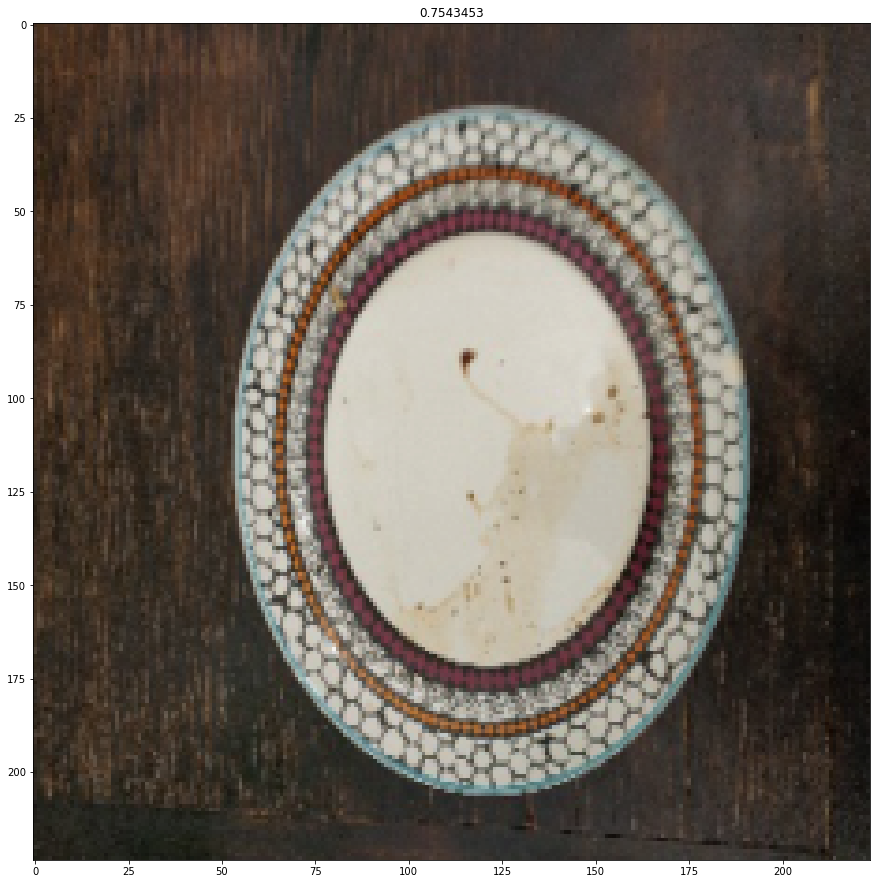

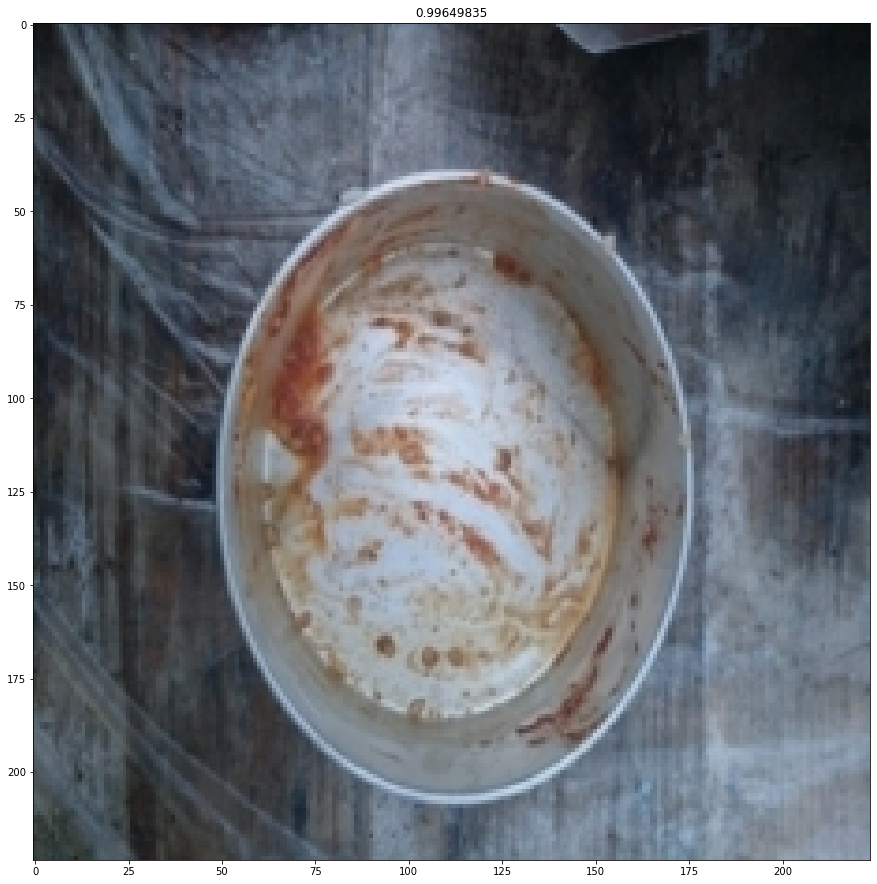

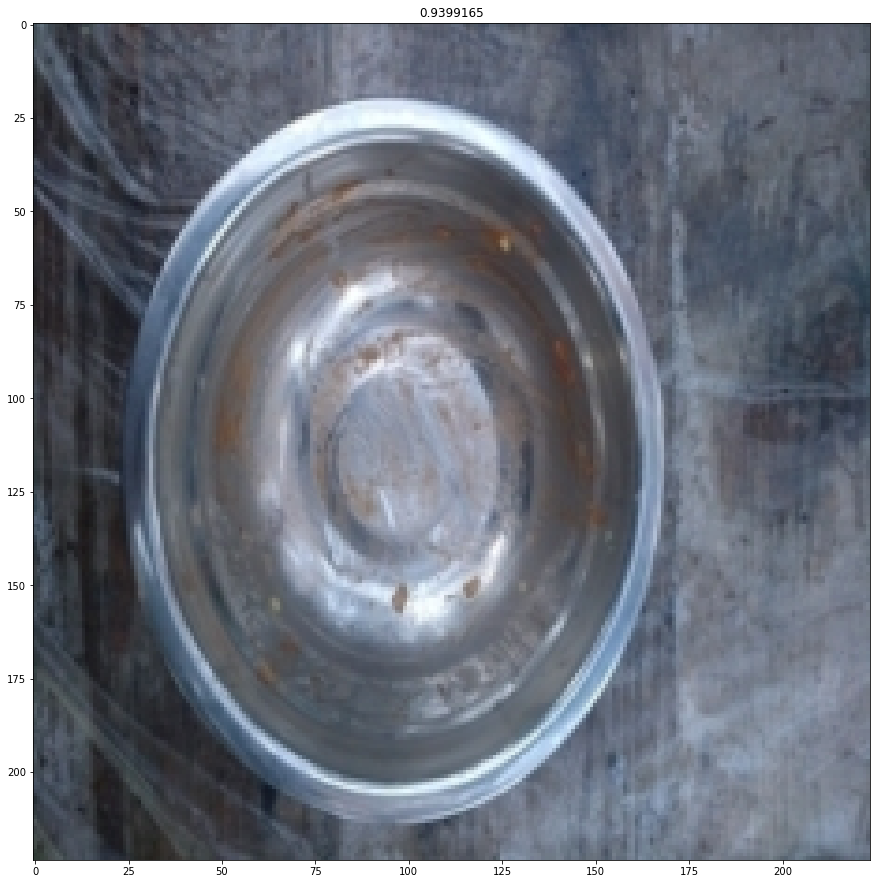

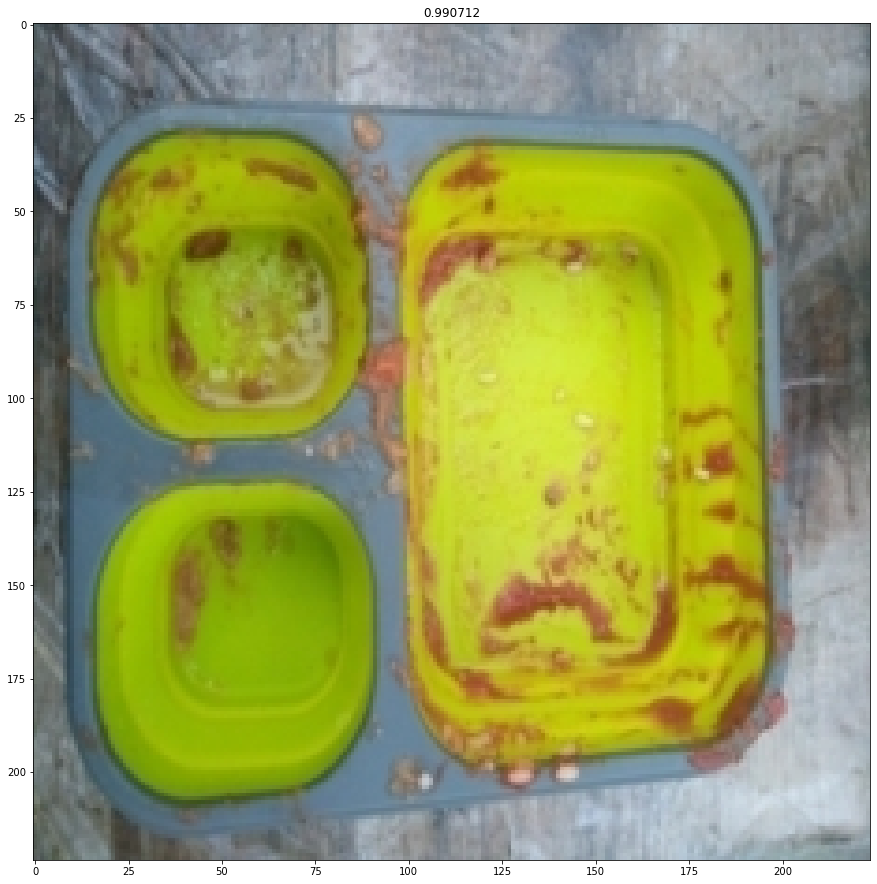

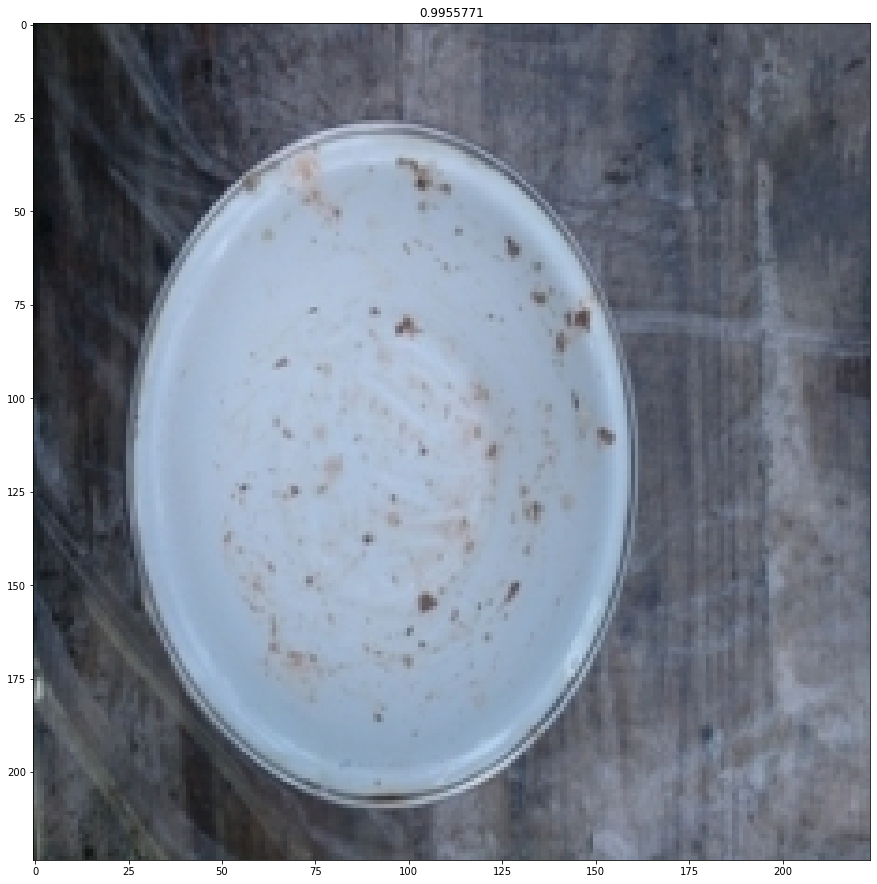

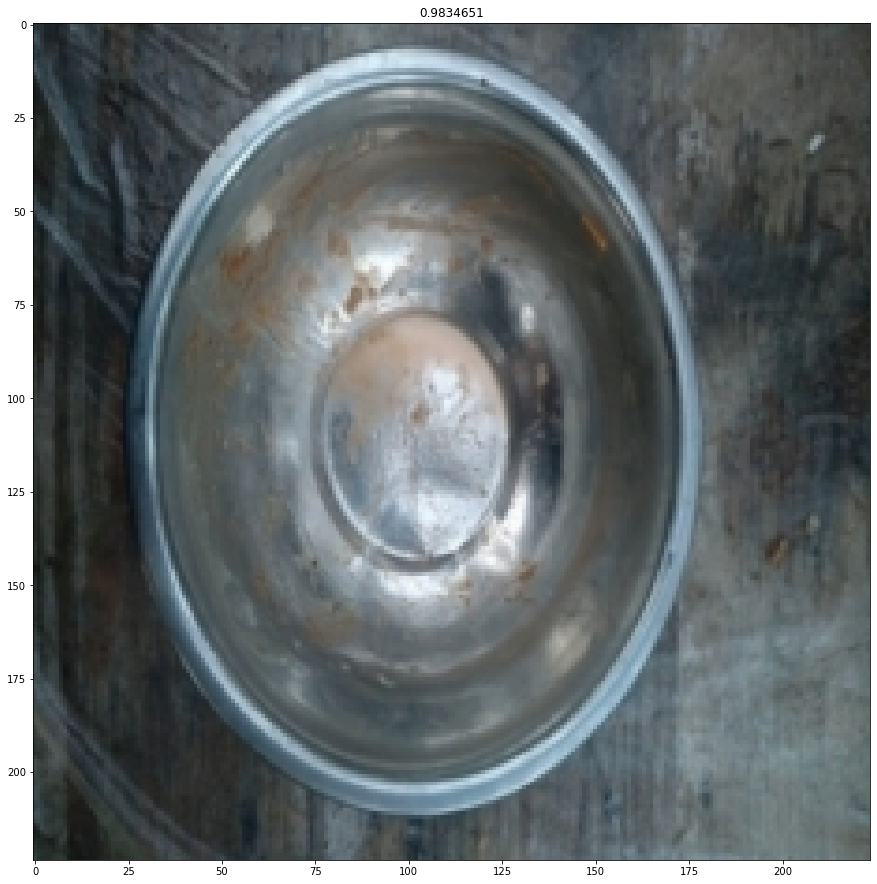

/tmp/ipykernel_564559/872232360.py:40: FutureWarning: The default value of regex will change from True to False in a future version.
  submission_df['id'] = submission_df['id'].str.replace('.jpg', '')


In [35]:
test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(test_dir, val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)

model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})

submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

!rm -rf train val test 

In [37]:
!rm -rf './plates_data'